In [ ]:
# Install Ultralytics package for YOLOv8
!pip install ultralytics

In [2]:
# Import necessary modules
import os
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

from ultralytics import YOLO

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 47.1/112.6 GB disk)


In [3]:
# Run prediction using CLI command
!yolo task=segment mode=predict model=yolov8l-seg.pt conf=0.25 source='https://ultralytics.com/images/bus.jpg'

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8l-seg summary (fused): 125 layers, 45,973,568 parameters, 0 gradients, 210.4 GFLOPs

image 1/1 /content/bus.jpg: 640x480 4 persons, 1 bus, 96.7ms
Speed: 11.8ms preprocess, 96.7ms inference, 101.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/runs/segment/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
from IPython.display import Image

# Using the exact path and extension from your sidebar
Image(filename='runs/segment/predict/bus.jpg', height=600)

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="0gOAjQ78U5jck3pO1479")
project = rf.workspace("pibulsongkarm-rajabhat-university-ifzi7").project("motorcycle_traffic_intersection_model-9zgnv")
version = project.version(66)
dataset = version.download("yolov8")


In [7]:
!ls /content/Motorcycle_Traffic_Intersection_Model-66/

data.yaml  README.dataset.txt  README.roboflow.txt  train


In [8]:
import os
import random
import shutil

# Paths
dataset_path = '/content/Motorcycle_Traffic_Intersection_Model-66'
train_img_dir = os.path.join(dataset_path, 'train/images')
train_lbl_dir = os.path.join(dataset_path, 'train/labels')

val_img_dir = os.path.join(dataset_path, 'valid/images')
val_lbl_dir = os.path.join(dataset_path, 'valid/labels')

# Create missing validation directories
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(val_lbl_dir, exist_ok=True)

# Grab all training images
images = [f for f in os.listdir(train_img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Split 20% for validation
val_ratio = 0.2
num_val = int(len(images) * val_ratio)
val_images = random.sample(images, num_val)

print(f"Moving {num_val} images and labels to validation set...")

for img_name in val_images:
    # Handle Image
    shutil.move(os.path.join(train_img_dir, img_name), os.path.join(val_img_dir, img_name))

    # Handle matching Label text file
    lbl_name = os.path.splitext(img_name)[0] + '.txt'
    train_lbl_path = os.path.join(train_lbl_dir, lbl_name)
    if os.path.exists(train_lbl_path):
        shutil.move(train_lbl_path, os.path.join(val_lbl_dir, lbl_name))

print("Validation split successfully created!")

Moving 309 images and labels to validation set...
Validation split successfully created!


In [9]:
!yolo task=segment mode=train model=yolov8l-seg.pt data=/content/Motorcycle_Traffic_Intersection_Model-66/data.yaml epochs=15 imgsz=640

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Motorcycle_Traffic_Intersection_Model-66/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=15, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=train-2, nbs=64, nms=False, opset=None, optimize=False, optimizer=au

In [11]:
!ls /content/runs/segment/

predict  train	train-2


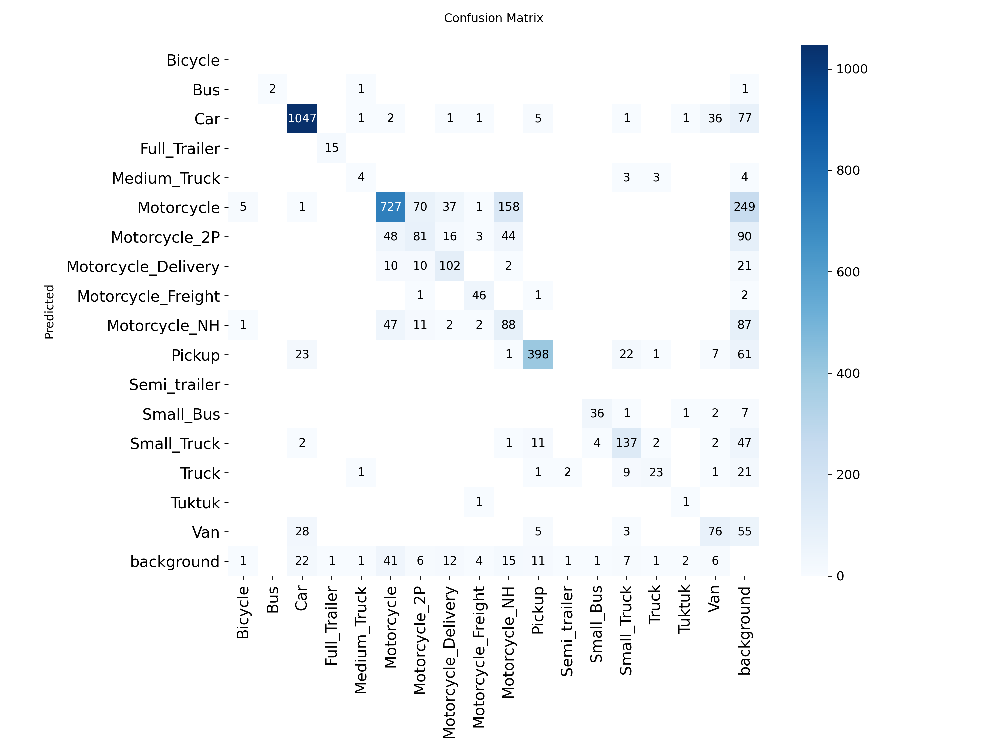

In [12]:
from IPython.display import Image, display

# Display the confusion matrix
display(Image(filename='/content/runs/segment/train-2/confusion_matrix.png', width=600))

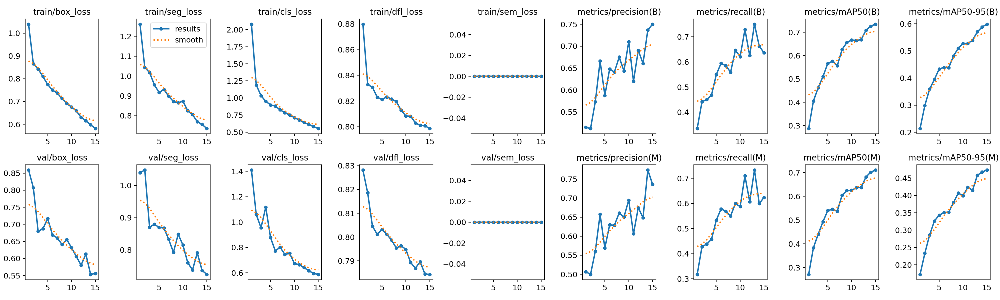

In [13]:
Image(filename=f'/content/runs/segment/train-2/results.png', width=600)

In [15]:
!yolo task=segment mode=val model=/content/runs/segment/train-2/weights/best.pt data=/content/Motorcycle_Traffic_Intersection_Model-66/data.yaml

Ultralytics 8.4.56 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8l-seg summary (fused): 126 layers, 45,924,995 parameters, 0 gradients, 210.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3493.8±716.5 MB/s, size: 502.7 KB)
val: Scanning /content/Motorcycle_Traffic_Intersection_Model-66/valid/labels.cache... 309 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 309/309 43.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 20/20 1.4it/s 14.3s
                   all        309       3571       0.75      0.637      0.735      0.605      0.735      0.622      0.707      0.463
               Bicycle          7          7          1          0     0.0697     0.0368          1          0     0.0697     0.0263
                   Bus          2          2      0.701          1      0.995      0.846      0.702          1      0.995       0.92
      

In [ ]:
!yolo task=segment mode=predict model=/content/runs/segment/train-2/weights/best.pt conf=0.4 source=/content/Motorcycle_Traffic_Intersection_Model-66/valid/images

Displaying 10 segmentation results:


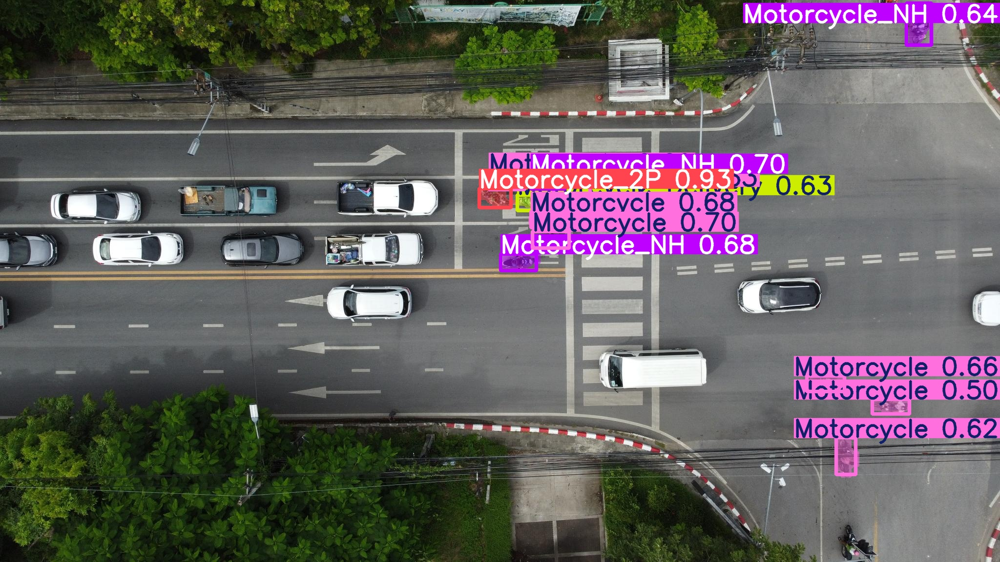

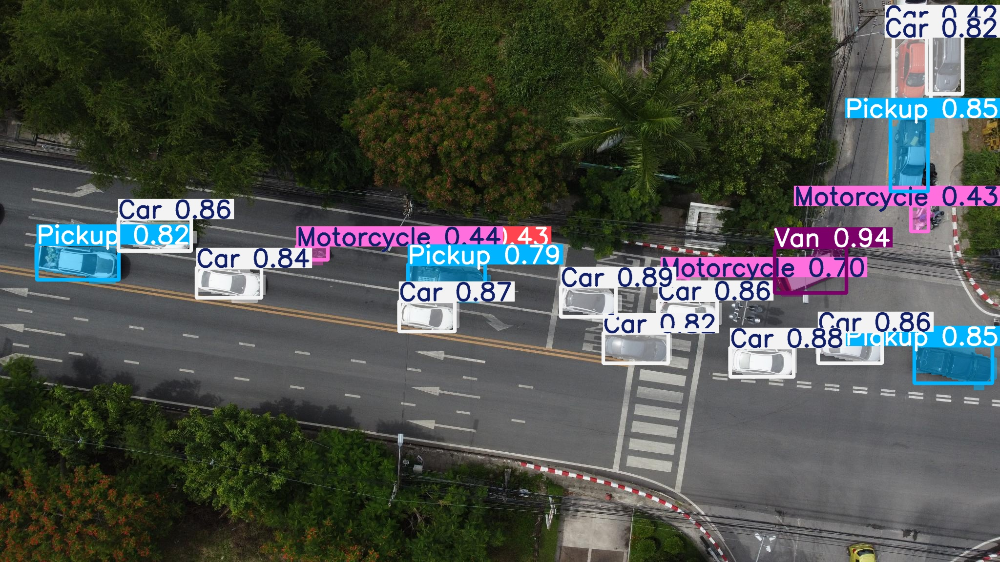

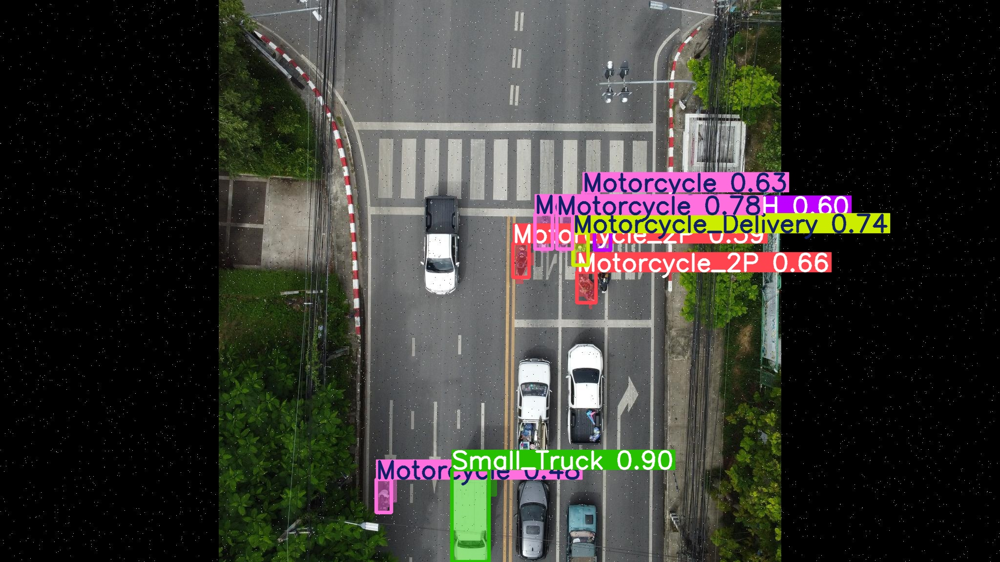

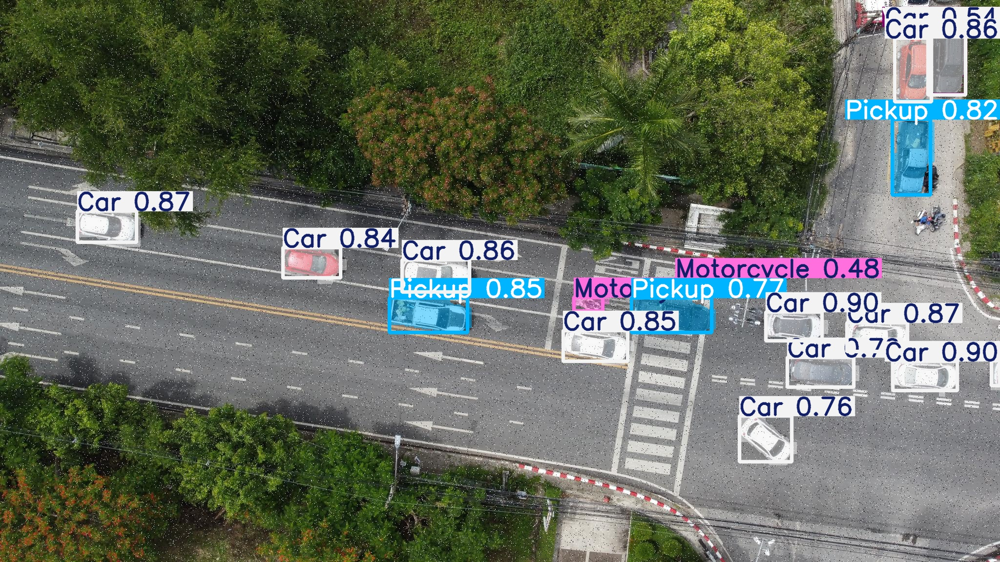

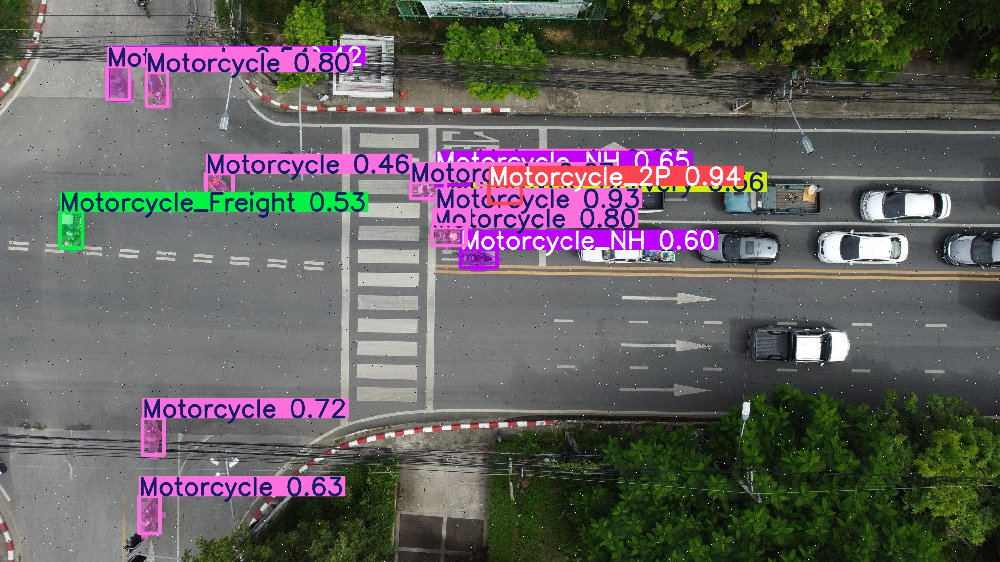

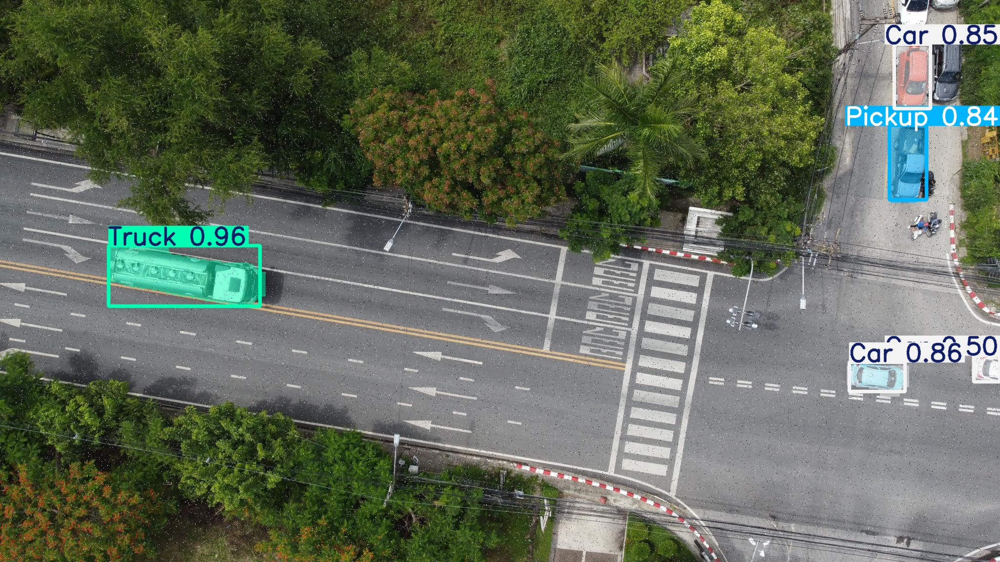

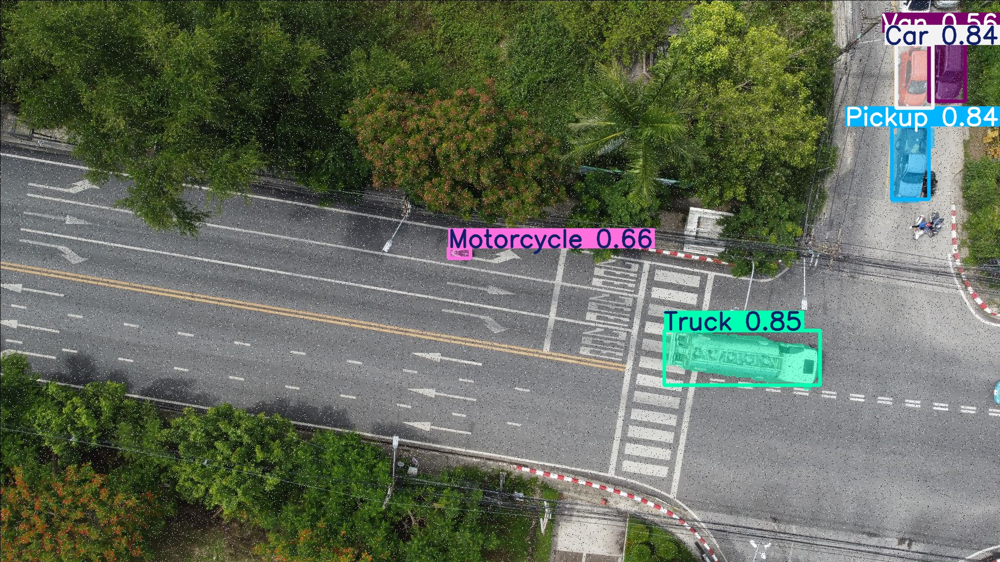

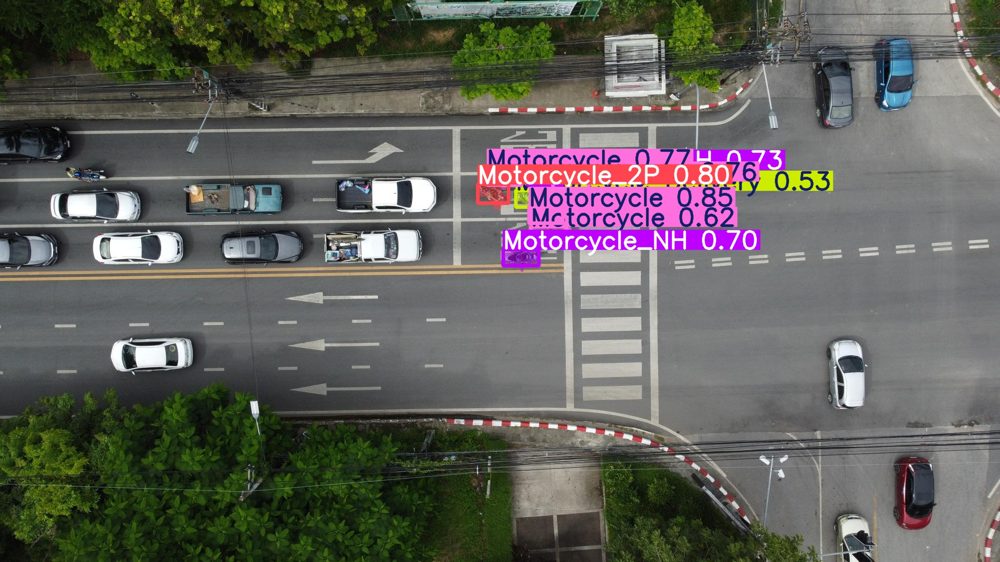

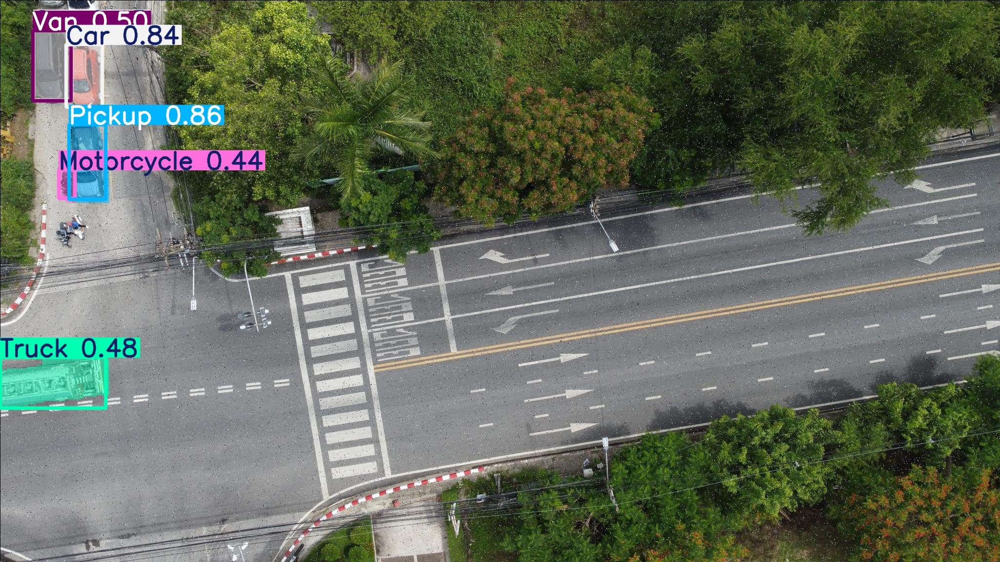

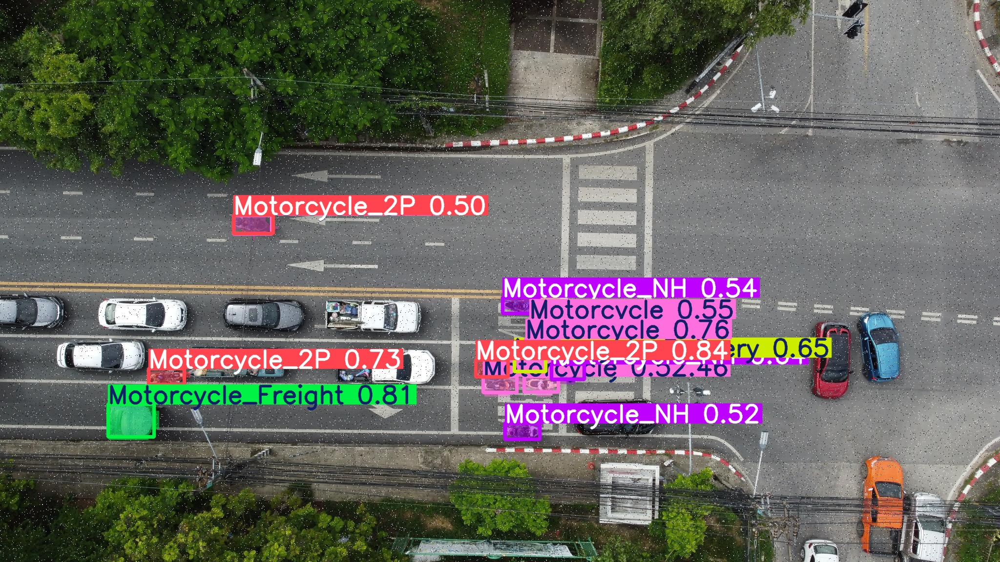

In [19]:
import glob
from IPython.display import Image, display

# Target your exact output folder
output_folder = '/content/runs/segment/predict-3'

# Gather your processed images
image_list = sorted(glob.glob(f'{output_folder}/*.jpg'))[:10]

if image_list:
    print(f"Displaying {len(image_list)} segmentation results:")
    for image_path in image_list:
        display(Image(filename=image_path, height=600))
        print("\n")
else:
    print(f"No images found inside {output_folder}. Double-check that the file extension is .jpg!")